<center><div><img src="http://dolphin-public.oss-cn-shanghai.aliyuncs.com/img/Map_visual/title1.png", width = 300/></div></center>

folium是JavaScript上著名的交互式地图库leaflet.js为Python提供的接口，通过它，我们可以在Python端调用leaflet的相关功能。

leaflet通过内建的OpenStreetMap或自行获取的osm资源和地图原件来进行地理信息内容的可视化，以及制作优美的可交互地图。其语法格式是通过不断添加图层元素来定义一个Map对象，最后以几种方式将Map对象展现出来。

在定义了所有图层内容之后，folium会生成一个html文件，我们可以在浏览器中打开它，也可以基于jupyter notebook嵌入对应的交互地图。以下均以嵌入地图作为显示方式。

[Folium官网](http://python-visualization.github.io/folium/index.html)

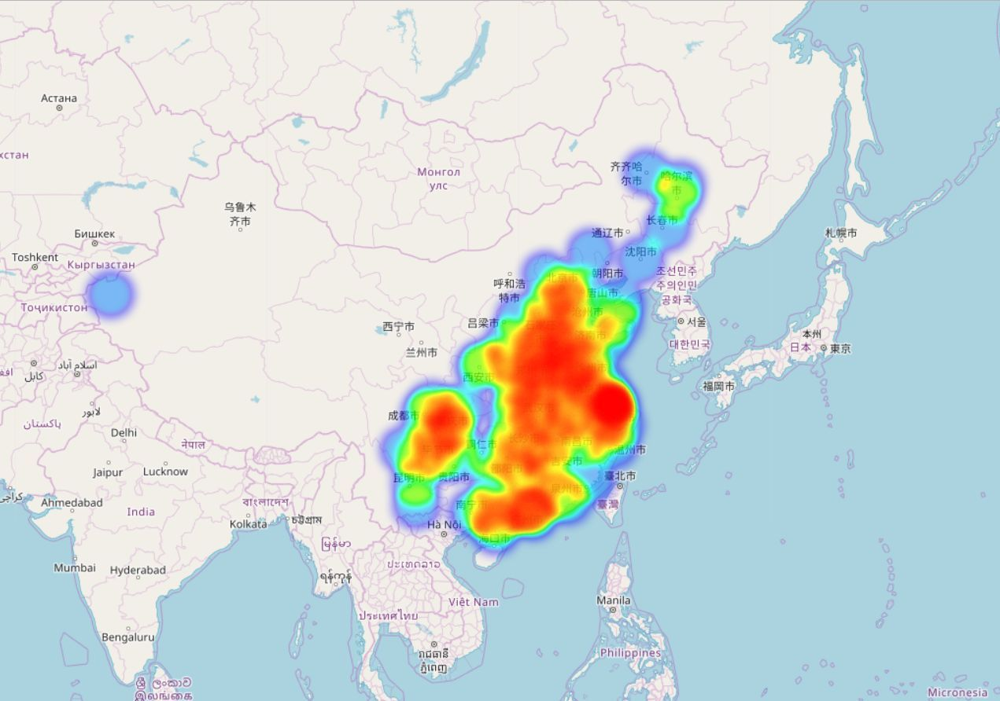

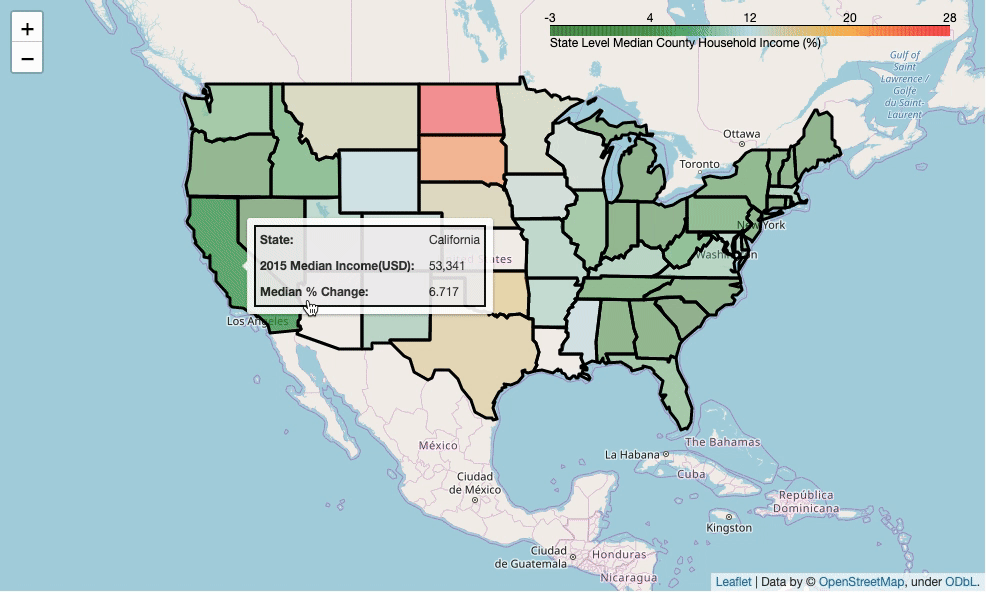

## 准备

In [ ]:
# # 科学计算
# !pip install pandas
# # 地理信息可视化
# !pip install folium
# !pip install branca
# # 图像处理
# !pip install pillow
# !pip install opencv-python
# # 交互式环境
# !pip install IPython

In [1]:
import ast
import base64
import os

import branca
import cv2
import folium
import pandas as pd
import requests
from folium.plugins import MarkerCluster
from IPython.display import IFrame
from PIL import Image
from PIL.ExifTags import TAGS

<div>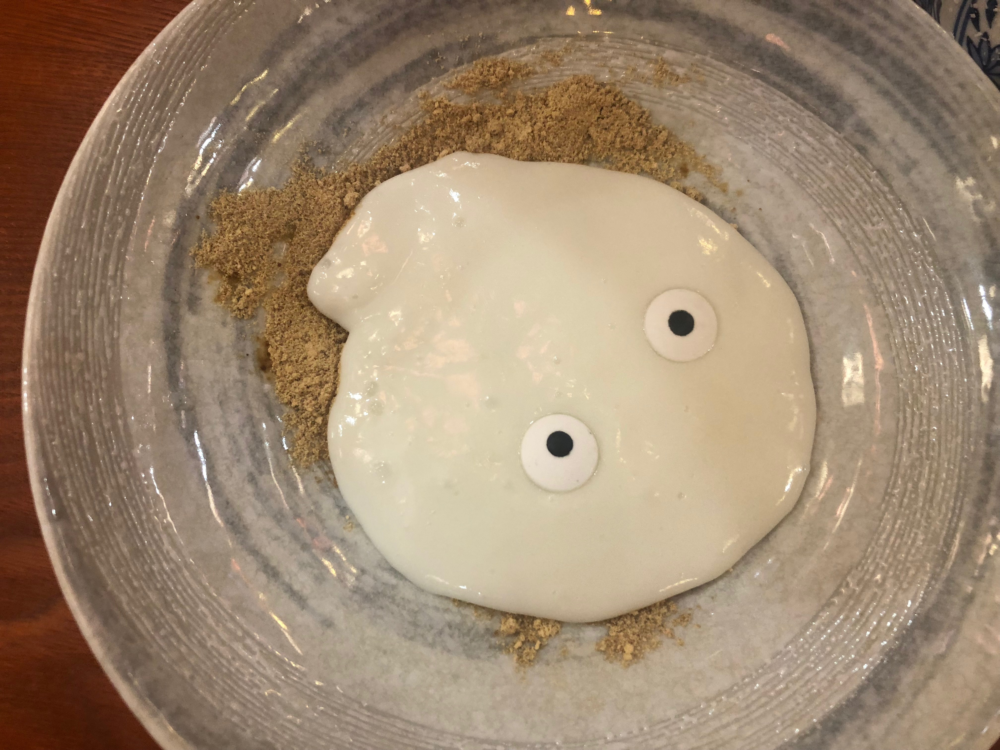</div>

## 图像定位

In [2]:
# 提取图片信息
img=Image.open('./123/food.jpg')
exifInfo = img._getexif()

In [3]:
# 获取经纬度
for tag, gpsValue in list(exifInfo.items()):
    decoded = TAGS.get(tag)
    if decoded == 'GPSInfo':
        gpsInfo = gpsValue

In [4]:
Npos = sum([(item[0]/item[1])*(1.0/(60**i)) for i, item in enumerate(gpsInfo[2])])
Epos = sum([(item[0]/item[1])*(1.0/(60**i)) for i, item in enumerate(gpsInfo[4])])
location = [Npos, Epos]

## 图片处理

In [5]:
imagePathName = './mini123/food.jpg'
encoded = base64.b64encode(open(imagePathName, 'rb').read())
height, width = cv2.imread(imagePathName).shape[:2]

## 建立地图

In [6]:
tile = [
    'http://wprd01.is.autonavi.com/appmaptile?x={x}&y={y}&z={z}&lang=zh_cn&size=1&scl=1&style=7',
    'http://wprd02.is.autonavi.com/appmaptile?x={x}&y={y}&z={z}&lang=zh_cn&size=1&scl=2&style=7',
    'http://wprd02.is.autonavi.com/appmaptile?x={x}&y={y}&z={z}&lang=zh_cn&size=1&scl=1&style=6',
]

In [7]:
map = folium.Map(
    location=[30.24, 120.16],
    zoom_start=6,
    tiles=tile[2],
    attr='高德地图')

In [8]:
# 图标
icon_path = './icon/足迹.png'
icon = folium.features.CustomIcon(icon_image=icon_path, icon_size=(30, 30))

In [9]:
HTML = """
            <center><img src='data:image/jpeg;base64,{}' style='width: {}px'></center>
            """
WIDTH = 650

In [10]:
html = HTML.format(encoded.decode('UTF-8'), str(WIDTH))
iframe = branca.element.IFrame(html=html, width=WIDTH+10, height=height-20)

In [11]:
popup = folium.Popup(iframe, max_width=650)
marker = folium.Marker(location=location, icon=icon,
                  popup=popup).add_to(map)

In [12]:
mapName = '123.html'
map.save(mapName)
IFrame(src=mapName, width=980, height=600)